In [ ]:
#!/usr/bin/env python
# coding: utf-8

In [ ]:
# On my personal machine: conda activate pinecone_poc

In [24]:
# Import necessary libraries
import json
import numpy as np
import pandas as pd
from pinecone import Pinecone
from dotenv import load_dotenv
import os
from tqdm.auto import tqdm
import time
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
from umap import UMAP
import plotly.express as px

In [2]:
# Load the Q&A data
with open('../generated_qa_pairs_combined_clean_20250603_214922.json', 'r') as f:
    data = json.load(f)

In [5]:
# Initialize Pinecone client using API key from environment variables
load_dotenv()
api_key = os.getenv("PINECONE_API_KEY")
if not api_key:
    raise ValueError("PINECONE_API_KEY not found in environment variables. Please check your .env file.")

pc = Pinecone(api_key=api_key)
model_name = "llama-text-embed-v2"

In [6]:
def generate_embeddings_in_batches(texts, model_name, batch_size=90):
    """
    Generate embeddings in batches to respect API limits
    Using batch_size=90 to stay safely under the 96 limit
    """
    all_embeddings = []
    
    print(f"Generating embeddings for {len(texts)} questions in batches of {batch_size}...")
    
    for i in tqdm(range(0, len(texts), batch_size)):
        batch = texts[i:i + batch_size]
        
        # Generate embeddings for this batch
        batch_response = pc.inference.embed(
            model=model_name,
            inputs=batch,
            parameters={"input_type": "query"}
        )
        
        # Extract embeddings from batch response
        batch_embeddings = []
        for embedding_obj in batch_response:
            if hasattr(embedding_obj, 'values'):
                batch_embeddings.append(embedding_obj.values)
            else:
                batch_embeddings.append(embedding_obj)
        
        all_embeddings.extend(batch_embeddings)
        
        # Small delay to be nice to the API
        time.sleep(0.1)
    
    return all_embeddings


In [9]:
# Generate embeddings
questions = [item['question_text'] for item in data]
embeddings = generate_embeddings_in_batches(questions, model_name)

Generating embeddings for 432 questions in batches of 90...


  0%|          | 0/5 [00:00<?, ?it/s]

## Prototyping Visualization of Embeddings

In [10]:
def create_similarity_heatmap():
    """Create similarity heatmap - shows full version + saves high-res file"""
    
    # Extract embeddings and metadata
    embedding_vectors = []
    metadata = []
    
    for i, item in enumerate(data):
        embedding_vectors.append(embeddings[i])
        metadata.append({
            'id': item['question_id'],
            'text': item['question_text'],
            'category': item['category']
        })
    
    # Convert to numpy array
    embedding_array = np.array(embedding_vectors)
    
    # Calculate cosine similarity matrix
    similarity_matrix = cosine_similarity(embedding_array)
    
    # Show warning message
    print(f"⚠️  Displaying full similarity heatmap ({len(metadata)}x{len(metadata)}) - may be difficult to read due to size")
    print(f"💾 Saving high-resolution version to 'full_similarity_heatmap.png' for detailed viewing...")
    
    # Show the full heatmap (might be hard to read)
    plt.figure(figsize=(16, 14))
    sns.heatmap(
        similarity_matrix, 
        xticklabels=[item['id'] for item in metadata],
        yticklabels=[item['id'] for item in metadata],
        cmap="YlGnBu", 
        vmin=0, 
        vmax=1,
        cbar_kws={'label': 'Cosine Similarity'}
    )
    plt.title(f'Cosine Similarity Between Question Embeddings ({len(metadata)} questions)', fontsize=16)
    plt.xlabel('Question IDs', fontsize=14)
    plt.ylabel('Question IDs', fontsize=14)
    plt.xticks(rotation=45, fontsize=6)
    plt.yticks(rotation=0, fontsize=6)
    plt.tight_layout()
    plt.show()
    
    # Save high-resolution version to file
    plt.figure(figsize=(24, 24))
    sns.heatmap(
        similarity_matrix,
        xticklabels=[item['id'] for item in metadata],
        yticklabels=[item['id'] for item in metadata], 
        cmap="YlGnBu", 
        vmin=0, 
        vmax=1,
        cbar_kws={'label': 'Cosine Similarity'}
    )
    plt.title(f'Complete Question Similarity Matrix ({len(metadata)} questions)', fontsize=20)
    plt.xticks(rotation=45, fontsize=2)
    plt.yticks(rotation=0, fontsize=2)
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    plt.savefig(f'full_similarity_heatmap_{timestamp}.pdf', bbox_inches='tight')
    plt.close()  # Close without showing the huge one
    
    print(f"💾 Saving high-resolution version to 'full_similarity_heatmap_{timestamp}.pdf' for detailed viewing...")
    
    return similarity_matrix, embedding_array, metadata

⚠️  Displaying full similarity heatmap (432x432) - may be difficult to read due to size
💾 Saving high-resolution version to 'full_similarity_heatmap.png' for detailed viewing...


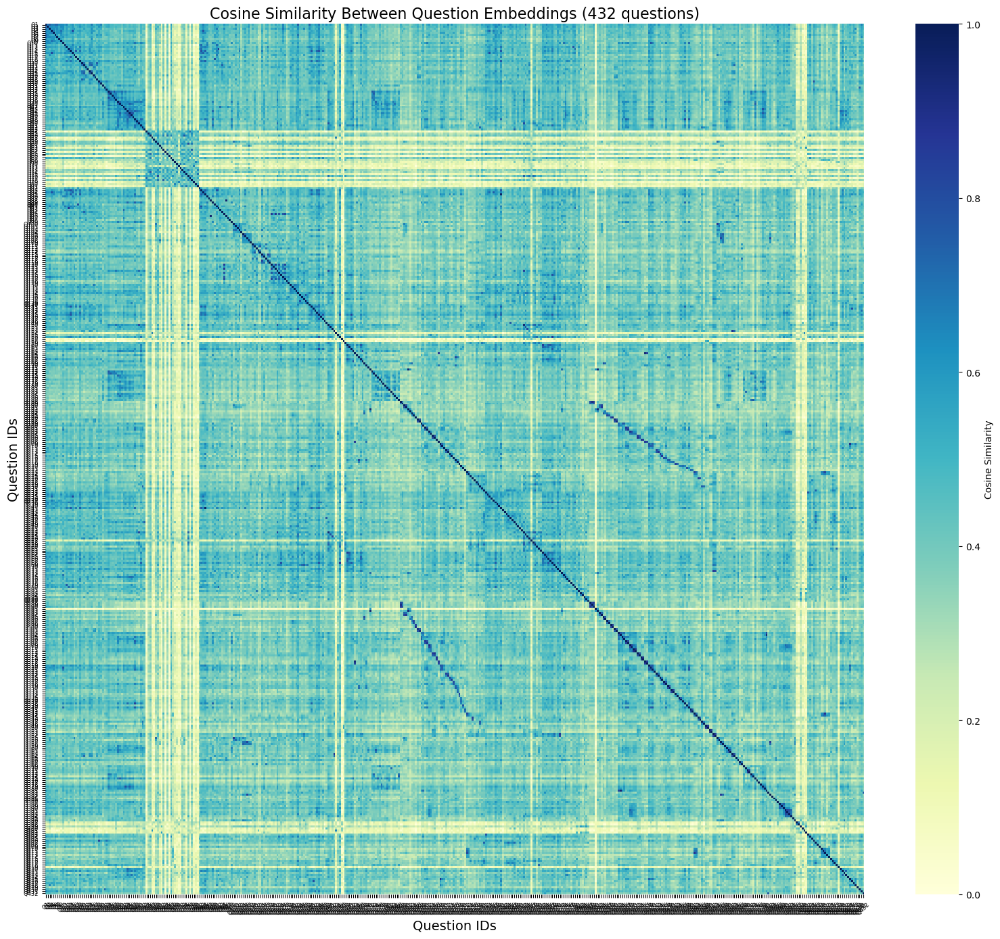

💾 Saving high-resolution version to 'full_similarity_heatmap_20250603_230753.pdf' for detailed viewing...


In [13]:
# Create the similarity heatmap
similarity_matrix, embedding_array, metadata = create_similarity_heatmap()

In [14]:
def create_clean_umap_viz(viz_df):
    """Create a single clean UMAP visualization"""
    
    # Create just ONE plot
    fig, ax = plt.subplots(1, 1, figsize=(12, 10))
    
    categories = viz_df['category'].unique()
    colors = plt.cm.Set3(np.linspace(0, 1, len(categories)))
    
    # Plot all points with legend
    for i, category in enumerate(categories):
        subset = viz_df[viz_df['category'] == category]
        ax.scatter(subset['x'], subset['y'], c=[colors[i]], 
                  label=category, alpha=0.8, s=100)
    
    # Add a few sample labels for reference
    sample_points = viz_df.sample(min(5, len(viz_df)))
    for idx, row in sample_points.iterrows():
        ax.annotate(row['id'], (row['x'], row['y']), 
                   fontsize=9, ha='center', va='bottom',
                   bbox=dict(boxstyle='round,pad=0.2', facecolor='white', alpha=0.8))
    
    ax.set_title('UMAP Projection of Question Embeddings', fontsize=16)
    ax.set_xlabel('UMAP Dimension 1', fontsize=14)
    ax.set_ylabel('UMAP Dimension 2', fontsize=14)
    ax.grid(True, alpha=0.3)
    
    # Put legend to the right with colors
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
    
    plt.tight_layout()
    plt.show()
    
    print(f"\nTotal questions: {len(viz_df)}")
    print(f"Categories: {len(categories)}")
    
    return fig

In [15]:
def create_umap_data():
    """Create UMAP data from embeddings"""
    embedding_vectors = []
    metadata = []
    
    for i, item in enumerate(data):
        embedding_vectors.append(embeddings[i])
        metadata.append({
            'id': item['question_id'],
            'text': item['question_text'],
            'category': item['category']
        })
    
    embedding_array = np.array(embedding_vectors)
    umap_model = UMAP(n_components=2, n_neighbors=3, min_dist=0.3, metric='cosine', random_state=42)
    embedding_2d = umap_model.fit_transform(embedding_array)
    
    viz_df = pd.DataFrame({
        'x': embedding_2d[:, 0],
        'y': embedding_2d[:, 1],
        'id': [item['id'] for item in metadata],
        'text': [item['text'] for item in metadata],
        'category': [item['category'] for item in metadata]
    })
    
    return viz_df, umap_model

In [16]:
# Function to add test queries to the visualization
def add_queries_to_visualization(queries, viz_df, umap_model):
    """Add test queries to the existing UMAP visualization"""
    # Generate embeddings for test queries
    query_embeddings = []
    
    for query in queries:
        query_embedding = pc.inference.embed(
            model=model_name,
            inputs=[query],
            parameters={"input_type": "query"}
        )
        
        # Extract vector values
        if hasattr(query_embedding[0], 'values'):
            query_vector = query_embedding[0].values
        else:
            query_vector = query_embedding[0]
            
        query_embeddings.append(query_vector)
    
    # Transform with the existing UMAP model
    query_embedding_array = np.array(query_embeddings)
    query_2d = umap_model.transform(query_embedding_array)
    
    # Create visualization
    plt.figure(figsize=(10, 8))
    
    # Plot original embeddings
    categories = viz_df['category'].unique()
    colors = plt.cm.rainbow(np.linspace(0, 1, len(categories)))
    
    for i, category in enumerate(categories):
        subset = viz_df[viz_df['category'] == category]
        plt.scatter(subset['x'], subset['y'], c=[colors[i]], label=category, alpha=0.6)
    
    # Add test queries
    plt.scatter(query_2d[:, 0], query_2d[:, 1], marker='*', s=200, c='red', label='Test Queries')
    
    # Add labels
    for i, query in enumerate(queries):
        plt.annotate(f"Q{i+1}: {query[:20]}...", (query_2d[i, 0], query_2d[i, 1]), fontsize=10)
    
    # Add legend and labels
    plt.title('Test Queries Projected onto UMAP Space')
    plt.xlabel('UMAP Dimension 1')
    plt.ylabel('UMAP Dimension 2')
    plt.legend()
    plt.tight_layout()
    plt.show()

In [19]:
# Create the UMAP data
viz_data, umap_model = create_umap_data()

/Users/joelswenson/anaconda3/envs/pinecone_poc/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/joelswenson/anaconda3/envs/pinecone_poc/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


/var/folders/6t/8gw2g3297335t9ssjrgfkm9m0000gn/T/ipykernel_21586/1748842327.py:31: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


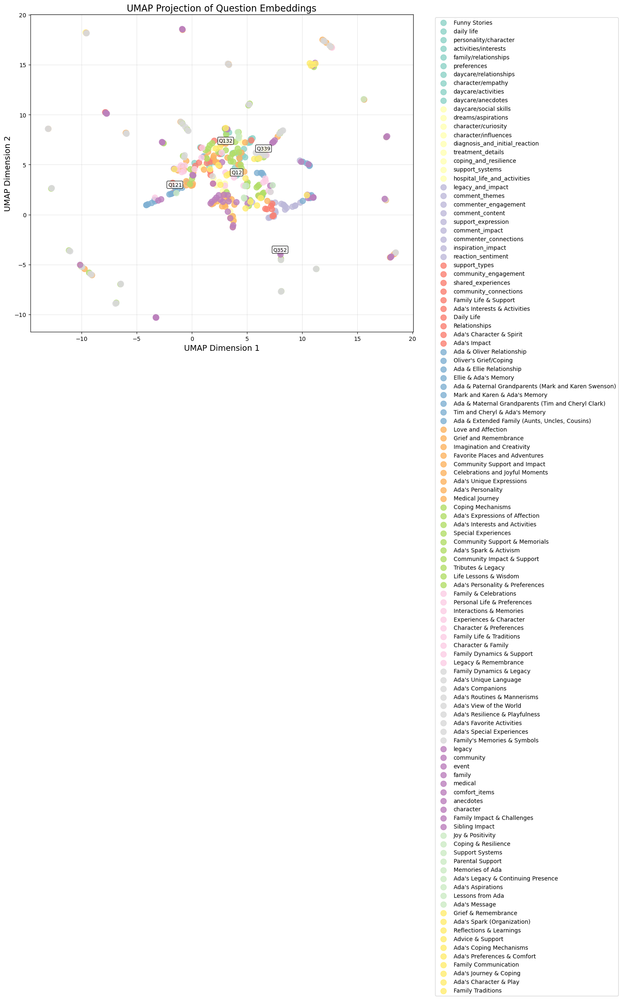


Total questions: 432
Categories: 113


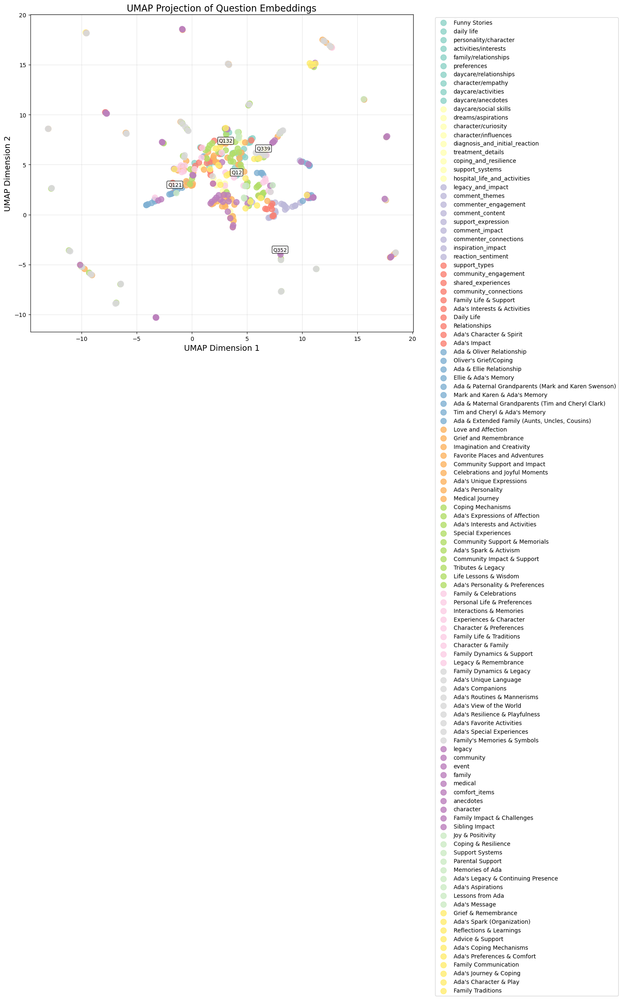

In [20]:
# Now create the basic visualization
create_clean_umap_viz(viz_data)

/Users/joelswenson/anaconda3/envs/pinecone_poc/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/var/folders/6t/8gw2g3297335t9ssjrgfkm9m0000gn/T/ipykernel_21586/373023815.py:49: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


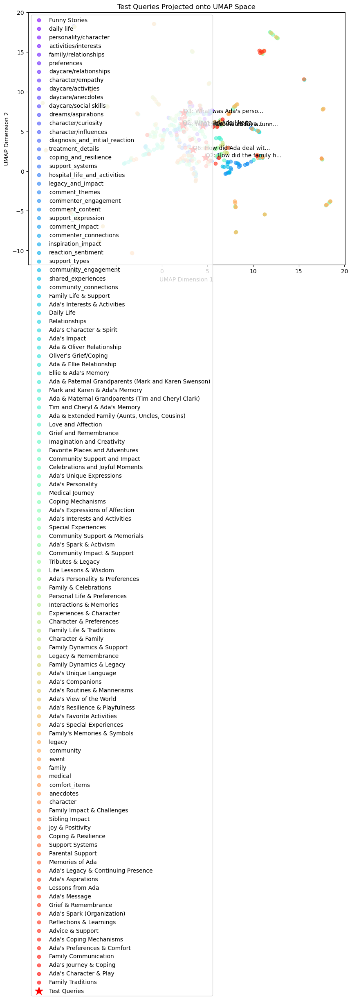

In [21]:
# Example test queries (uncomment to use)
test_queries = [
    "Tell me about a funny Ada story",
    "How did the family handle difficult times?",
    "What was Ada's personality like?",
    "What were Ada's favorite things to do?",
    "What did Ada like to do?",
    "How did Ada deal with being sick"
]
add_queries_to_visualization(test_queries, viz_data, umap_model)

In [22]:
def interactive_umap_viz(viz_df):
    fig = px.scatter(
        viz_df, x='x', y='y', color='category',
        hover_data=['id', 'text'],
        title='Interactive UMAP of Question Embeddings'
    )
    fig.update_traces(marker=dict(size=12))
    fig.show()

In [25]:
interactive_umap_viz(viz_data)